# **Automated Valuation Models**

### **Reserach Question :** How does machine learning regression models performance compare to classical linear and parametric regression models such as Ordinary Least Squares?

### **Topic :**  Does estimation window size affects accuracy (rolling window)? 

### To test whether or not estimation window size affects accuracy, In the first model, the data is divided into train data for first one and half years and test data for the rest, and from the next model, the RMSE of all models is compared by adding one month to the train data until the test model reaches one month.

## **Data**
Data : Melbourne housing clearance data from Jan 2016 to 2018

Link : https://www.kaggle.com/anthonypino/melbourne-housing-market?select=Melbourne_housing_FULL.csv

Type : Regression

## **Target, Evaluation index**

Target: Price

Evaluation criteria: Root Mean Square Error (RMSE)


###**Short explaination of some features**

Price: Price in dollars

Rooms: Number of rooms

Method: S - property sold; SP - property sold prior; PI - property passed in; PN - sold prior not disclosed; SN - sold not disclosed; NB - no bid; VB - vendor bid; W - withdrawn prior to auction; SA - sold after auction; SS - sold after auction price not disclosed. N/A - price or highest bid not available.

Type: br - bedroom(s); h - house,cottage,villa, semi,terrace; u - unit, duplex; t - townhouse; dev site - development site; o res - other residential.

SellerG: Real Estate Agent

Date: Date sold

Distance: Distance from CBD

Regionname: General Region (West, North West, North, North east …etc)

Propertycount: Number of properties that exist in the suburb.

Bedroom2 : Scraped # of Bedrooms (from different source)

Bathroom: Number of Bathrooms

Car: Number of carspots

Landsize: Land Size

BuildingArea: Building Size

CouncilArea: Governing council for the area


In [166]:
#!pip install pandas-profiling==2.*

In [167]:
import pandas as pd
import numpy as  np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate

.











#**1. A first look to the dataset**



In [168]:
# Data upload
from google.colab import files
myfile = files.upload()

Saving Melbourne_housing_FULL.csv to Melbourne_housing_FULL (1).csv


In [169]:
df= pd.read_csv("Melbourne_housing_FULL.csv")

In [170]:
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.5,3067.0,2.0,1.0,1.0,126.0,NaN,NaN,Yarra City Council,-37.8014,144.9958,Northern Metropolitan,4019.0
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra City Council,-37.7996,144.9984,Northern Metropolitan,4019.0
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019.0
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/02/2016,2.5,3067.0,3.0,2.0,1.0,0.0,NaN,NaN,Yarra City Council,-37.8114,145.0116,Northern Metropolitan,4019.0
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019.0


In [171]:
df.shape

(34857, 21)

In [172]:
# Profiling

from pandas_profiling import ProfileReport
ProfileReport(df)

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [173]:
# Converting Date to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Rooms and Bedroom2 have high correlation.So Bedroom2 must be dropped
df=df.drop(axis=1,columns='Bedroom2')

# Postcode is categorial, shoule be object

# Bathroom ,Car, Yearbuilt should be integer

In [174]:
df.describe()

,Rooms,Price,Distance,Postcode,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,34857.000000,2.724700e+04,34856.000000,34856.000000,26631.000000,26129.000000,23047.000000,13742.00000,15551.000000,26881.000000,26881.000000,34854.000000
mean,3.031012,1.050173e+06,11.184929,3116.062859,1.624798,1.728845,593.598993,160.25640,1965.289885,-37.810634,145.001851,7572.888306
std,0.969933,6.414671e+05,6.788892,109.023903,0.724212,1.010771,3398.841946,401.26706,37.328178,0.090279,0.120169,4428.090313
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.00000,1196.000000,-38.190430,144.423790,83.000000
25%,2.000000,6.350000e+05,6.400000,3051.000000,1.000000,1.000000,224.000000,102.00000,1940.000000,-37.862950,144.933500,4385.000000
50%,3.000000,8.700000e+05,10.300000,3103.000000,2.000000,2.000000,521.000000,136.00000,1970.000000,-37.807600,145.007800,6763.000000
75%,4.000000,1.295000e+06,14.000000,3156.000000,2.000000,2.000000,670.000000,188.00000,2000.000000,-37.754100,145.071900,10412.000000
max,16.000000,1.120000e+07,48.100000,3978.000000,12.000000,26.000000,433014.000000,44515.00000,2106.000000,-37.390200,145.526350,21650.000000


In [175]:
# When BuildingArea is 0 or Landsize is 0

display(len(df[(df['BuildingArea'] == 0)]),len(df[(df['Landsize'] == 0)]))

76

2437

In [176]:
# BuildingArea and Landsize cannot be 0, so drop

df=df[~(df['BuildingArea'] == 0)]
df=df[~(df['Landsize'] == 0)]
display(len(df[(df['BuildingArea'] == 0)]),len(df[(df['Landsize'] == 0)]))

0

0

In [177]:
# when YearBuilt is after 2019

len(df[(df['YearBuilt'] >= 2019)])

2

In [178]:
# Data is form 2016 to 2018 so 2019 data could not exist. Drop.

df=df[~(df['YearBuilt'] >= 2019)]
len(df[(df['YearBuilt'] >= 2019)])

0

In [179]:
# reset index
df = df.reset_index()

In [180]:
df=df.drop(axis=1,columns='index')

#**2. Data cleaning**

##**2.1. Duplitcate values**

In [181]:
# Check Duplitcate values

len(df[df.duplicated()==True]) 

1

In [182]:
# Remove duplicate values

df=df.drop_duplicates()
len(df[df.duplicated()==True]) 

0

##**2.2. Missing values**

In [183]:
# Check Missing values

df.isnull().sum()

Suburb               0
Address              0
Rooms                0
Type                 0
Price             7098
Method               0
SellerG              0
Date                 0
Distance             1
Postcode             1
Bathroom          8226
Car               8726
Landsize         11790
BuildingArea     20005
YearBuilt        18472
CouncilArea          3
Lattitude         7971
Longtitude        7971
Regionname           3
Propertycount        3
dtype: int64

In [184]:
# Inserting the median on the missing values of numeric data

df['Price']= df['Price'].fillna(df['Price'].median())
df['Distance']= df['Distance'].fillna(df['Distance'].median())
df['Landsize']= df['Landsize'].fillna(df['Landsize'].median())
df['BuildingArea']= df['BuildingArea'].fillna(df['BuildingArea'].median())
df['YearBuilt']= df['YearBuilt'].fillna(df['YearBuilt'].median())
df['Lattitude']= df['Lattitude'].fillna(df['Lattitude'].median())
df['Longtitude']= df['Longtitude'].fillna(df['Longtitude'].median())

In [185]:
# Putting Modes on Missing values in Categorical Data

df['Car']= df['Car'].fillna(df['Car'].mode()[0])
df['Bathroom']= df['Bathroom'].fillna(df['Bathroom'].mode()[0])
df['Postcode']= df['Postcode'].fillna(df['Postcode'].mode()[0])
df['CouncilArea']= df['CouncilArea'].fillna(df['CouncilArea'].mode()[0])
df['Regionname']= df['Regionname'].fillna(df['Regionname'].mode()[0])
df['Propertycount']= df['Propertycount'].fillna(df['Propertycount'].mode()[0])

In [186]:
# after processing missing values
df.isnull().sum()

Suburb           0
Address          0
Rooms            0
Type             0
Price            0
Method           0
SellerG          0
Date             0
Distance         0
Postcode         0
Bathroom         0
Car              0
Landsize         0
BuildingArea     0
YearBuilt        0
CouncilArea      0
Lattitude        0
Longtitude       0
Regionname       0
Propertycount    0
dtype: int64

In [187]:
# change Bathroom, car and YearBuilt to integer

df['Bathroom']=df['Bathroom'].astype('int64')
df['Car']=df['Car'].astype('int64')
df['YearBuilt']=df['YearBuilt'].astype('int64')

# Change Postcode to object

df['Postcode']= df['Postcode'].astype('object')

In [188]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32341 entries, 0 to 32341
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         32341 non-null  object        
 1   Address        32341 non-null  object        
 2   Rooms          32341 non-null  int64         
 3   Type           32341 non-null  object        
 4   Price          32341 non-null  float64       
 5   Method         32341 non-null  object        
 6   SellerG        32341 non-null  object        
 7   Date           32341 non-null  datetime64[ns]
 8   Distance       32341 non-null  float64       
 9   Postcode       32341 non-null  object        
 10  Bathroom       32341 non-null  int64         
 11  Car            32341 non-null  int64         
 12  Landsize       32341 non-null  float64       
 13  BuildingArea   32341 non-null  float64       
 14  YearBuilt      32341 non-null  int64         
 15  CouncilArea    3234

##**2.3. Feature engineering**

In [189]:
# Create Year and doy(day of year)

df['Year'] = df['Date'].dt.year

df['doy'] = df['Date'].dt.dayofyear

In [190]:
#Create a feature called season using the doy feature

spring = range(80, 172)
summer = range(172, 264)
fall = range(264, 355)
#winter = else

v=[]
for i in df['doy']:

  if i in spring:
    season='spring'
  elif i in summer:
    season = 'summer'
  elif i in fall:
    season = 'fall'
  else:
    season = 'winter'
  v.append(season)  

df['season']= pd.Series(v)

In [191]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32341 entries, 0 to 32341
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         32341 non-null  object        
 1   Address        32341 non-null  object        
 2   Rooms          32341 non-null  int64         
 3   Type           32341 non-null  object        
 4   Price          32341 non-null  float64       
 5   Method         32341 non-null  object        
 6   SellerG        32341 non-null  object        
 7   Date           32341 non-null  datetime64[ns]
 8   Distance       32341 non-null  float64       
 9   Postcode       32341 non-null  object        
 10  Bathroom       32341 non-null  int64         
 11  Car            32341 non-null  int64         
 12  Landsize       32341 non-null  float64       
 13  BuildingArea   32341 non-null  float64       
 14  YearBuilt      32341 non-null  int64         
 15  CouncilArea    3234

#**3. Visualizatoin**

##**3.1 Boxplots and histograms**

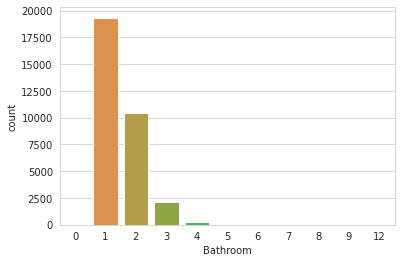

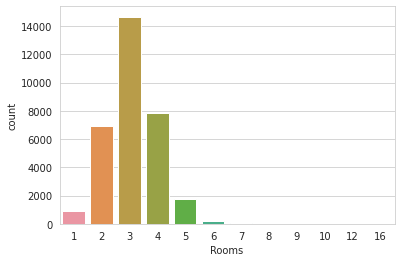

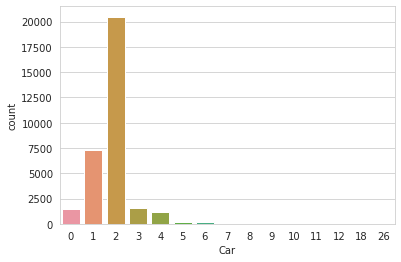

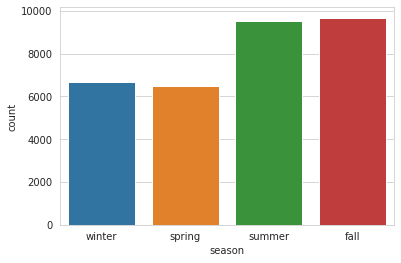

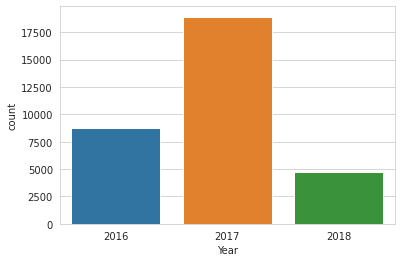

In [192]:
# ordinal data

l= ['Bathroom', 'Rooms', 'Car', 'season', 'Year']
for i in l:
    plt.figure()
    sns.countplot(x=i, data=df)



* There are 1~2 bathrooms on average.
* There are 2~4 rooms on average
* There is room for an average of 2 cars.
* Many real estate sales were made in 2017.
* More real estate sales were made in summer or fall
---



Text(0.5, 1.0, 'Rooms & Price')

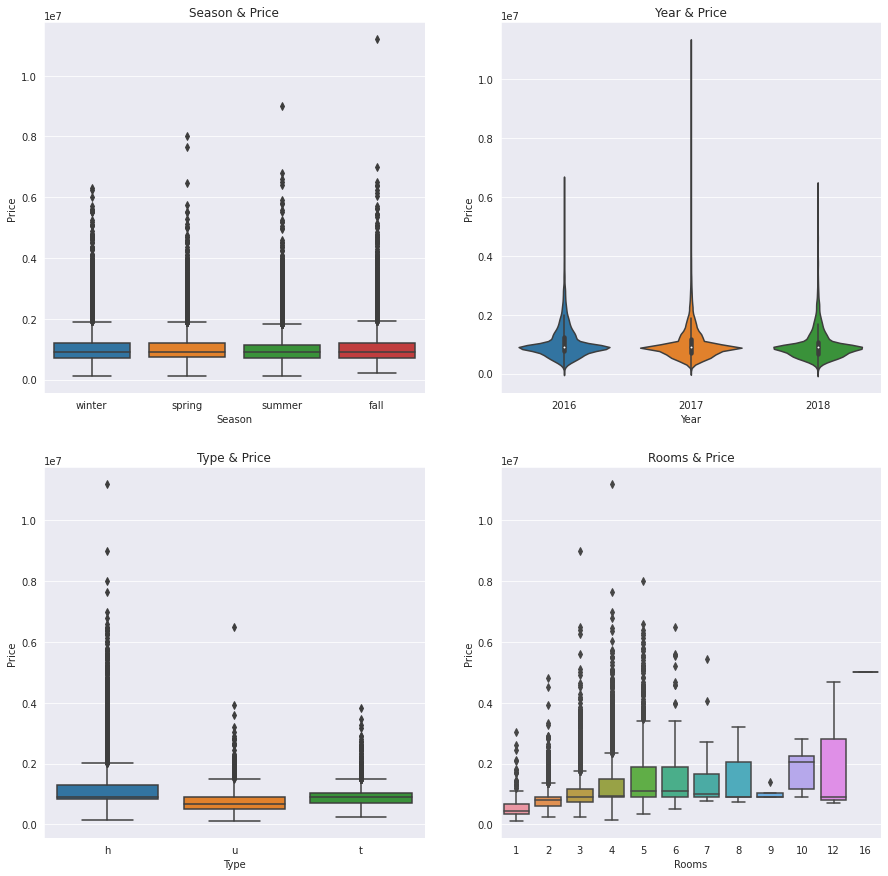

In [193]:
# Features that may affect the target

sns.set_style('darkgrid')
f, axes = plt.subplots(2,2, figsize = (15,15))

# Plot [0,0]
sns.boxplot(data = df, x = 'season', y = 'Price', ax = axes[0, 0])
axes[0,0].set_xlabel('Season')
axes[0,0].set_ylabel('Price')
axes[0,0].set_title('Season & Price')

# Plot [0,1]
sns.violinplot(data = df, x = 'Year', y = 'Price', ax = axes[0, 1])
axes[0,1].set_xlabel('Year')
axes[0,1].set_ylabel('Price')
axes[0,1].set_title('Year & Price')

# Plot [1,0]
sns.boxplot(x = 'Type', y = 'Price', data = df, ax = axes[1,0])
axes[1,0].set_xlabel('Type')
axes[1,0].set_ylabel('Price')
axes[1,0].set_title('Type & Price')

# Plot [1,1]
sns.boxplot(x = 'Rooms', y = 'Price', data = df, ax = axes[1,1])
axes[1,1].set_xlabel('Rooms')
axes[1,1].set_ylabel('Price')
axes[1,1].set_title('Rooms & Price')

* Season doesn't have a big impact on real estate prices.
* Year also doesn't have a big impact on price.
* Type seems to have more expensive h and more price fluctuations. Type seems to have an effect on real estate prices.
* Prices seem to increase slightly linearly for more rooms. Has an effect.
---



##**3.2 Correlation matrix**

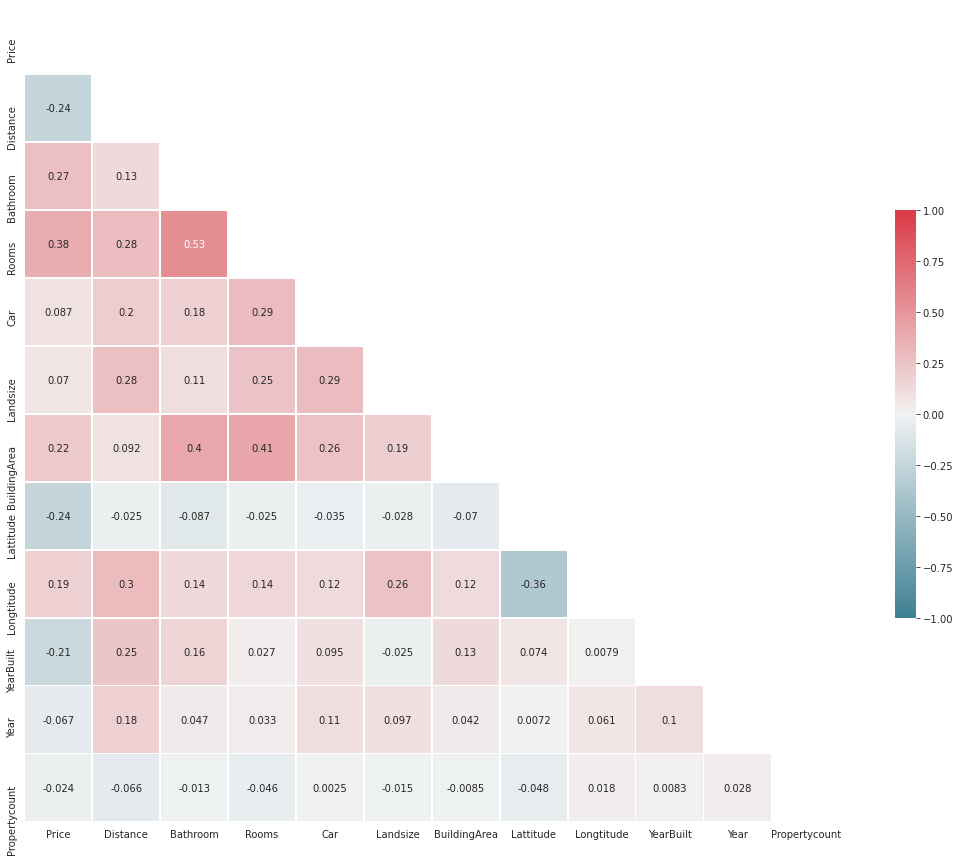

In [194]:
attributes= ['Price', 'Distance', 'Bathroom', 'Rooms', 'Car', 'Landsize', 'BuildingArea', 'Lattitude', 'Longtitude', 'YearBuilt',
             'Year', 'Propertycount']
h= df[attributes]

#whitegrid
sns.set_style('whitegrid')

corr_matrix=h.corr(method='spearman')


# Heatmap
plt.figure(figsize=(20,15))

# Generate a mask for the upper triangle
mask = np.zeros_like(corr_matrix, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix, mask=mask, cmap=cmap, center=0, vmax=1, vmin =-1, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

Relationship between Price and other variables

* Rooms(.38) has the highest correaltion.
* Bathroom (.27) and BuildingArea (.22) also have high correlation.
* Distance (-.24) and Lattitude (-.024) have the lowest correlation.
* Features with correlation close to 0 can be seen to have little effect on price..


---





#**4. Machine Learning**

##**4.1 Dividing Data**
###**The most important part, Set the first train data for the first one and half years, then add a month to the next model.**

In [195]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32341 entries, 0 to 32341
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         32341 non-null  object        
 1   Address        32341 non-null  object        
 2   Rooms          32341 non-null  int64         
 3   Type           32341 non-null  object        
 4   Price          32341 non-null  float64       
 5   Method         32341 non-null  object        
 6   SellerG        32341 non-null  object        
 7   Date           32341 non-null  datetime64[ns]
 8   Distance       32341 non-null  float64       
 9   Postcode       32341 non-null  object        
 10  Bathroom       32341 non-null  int64         
 11  Car            32341 non-null  int64         
 12  Landsize       32341 non-null  float64       
 13  BuildingArea   32341 non-null  float64       
 14  YearBuilt      32341 non-null  int64         
 15  CouncilArea    3234

In [196]:
#Drop features that no effect on price

df= df.drop(['Suburb', 'Address', 'Method', 'SellerG', 'Postcode', 'CouncilArea', 'doy'], axis=1)

In [197]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32341 entries, 0 to 32341
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Rooms          32341 non-null  int64         
 1   Type           32341 non-null  object        
 2   Price          32341 non-null  float64       
 3   Date           32341 non-null  datetime64[ns]
 4   Distance       32341 non-null  float64       
 5   Bathroom       32341 non-null  int64         
 6   Car            32341 non-null  int64         
 7   Landsize       32341 non-null  float64       
 8   BuildingArea   32341 non-null  float64       
 9   YearBuilt      32341 non-null  int64         
 10  Lattitude      32341 non-null  float64       
 11  Longtitude     32341 non-null  float64       
 12  Regionname     32341 non-null  object        
 13  Propertycount  32341 non-null  float64       
 14  Year           32341 non-null  int64         
 15  season         3234

In [198]:
# Onehot encoding

hD= pd.get_dummies(df, columns= ['Type', 'Regionname', 'season'])
hD.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32341 entries, 0 to 32341
Data columns (total 28 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   Rooms                                  32341 non-null  int64         
 1   Price                                  32341 non-null  float64       
 2   Date                                   32341 non-null  datetime64[ns]
 3   Distance                               32341 non-null  float64       
 4   Bathroom                               32341 non-null  int64         
 5   Car                                    32341 non-null  int64         
 6   Landsize                               32341 non-null  float64       
 7   BuildingArea                           32341 non-null  float64       
 8   YearBuilt                              32341 non-null  int64         
 9   Lattitude                              32341 non-null  float6

(None,
 Index(['Rooms', 'Price', 'Date', 'Distance', 'Bathroom', 'Car', 'Landsize',
        'BuildingArea', 'YearBuilt', 'Lattitude', 'Longtitude', 'Propertycount',
        'Year', 'Type_h', 'Type_t', 'Type_u', 'Regionname_Eastern Metropolitan',
        'Regionname_Eastern Victoria', 'Regionname_Northern Metropolitan',
        'Regionname_Northern Victoria', 'Regionname_South-Eastern Metropolitan',
        'Regionname_Southern Metropolitan', 'Regionname_Western Metropolitan',
        'Regionname_Western Victoria', 'season_fall', 'season_spring',
        'season_summer', 'season_winter'],
       dtype='object'))

In [199]:
hD['Date'].value_counts

<bound method IndexOpsMixin.value_counts of 0       2016-03-09
1       2016-03-12
2       2016-04-02
3       2017-04-03
4       2017-04-03
           ...    
32337   2018-02-24
32338   2018-02-24
32339   2018-02-24
32340   2018-02-24
32341   2018-02-24
Name: Date, Length: 32341, dtype: datetime64[ns]>

In [200]:
# Dividing Data

# Train = 2016.03 ~ 2017.07,  Test = 2017.08~

train_1 = hD[hD['Date']<='2017.07.31']

test_1 = hD[hD['Date']>'2017.07.31']

# Train = 2016.03 ~ 2017.08, Test = 2017.09~
train_2 =  hD[hD['Date']<='2017.08.31']

test_2 = hD[hD['Date']>'2017.08.31']

# Train = 2016.03 ~ 2017.9, Test = 2017.10~
train_3 =  hD[hD['Date']<='2017.09.30']

test_3 =  hD[hD['Date']>'2017.09.30']

# Train = 2016.03 ~ 2017.10, Test = 2017.11~
train_4 = hD[hD['Date']<='2017.10.31']

test_4 =  hD[hD['Date']>'2017.10.31']

# Train = 2016.03 ~ 2017.11, Test = 2017.12~
train_5 = hD[hD['Date']<='2017.11.30']

test_5 = hD[hD['Date']>'2017.11.30']

# Train = 2016.03 ~ 2018.12, Test = 2018.01~
train_6 = hD[hD['Date']<='2017.12.31']

test_6 = hD[hD['Date']>'2017.12.31']

# Train = 2016.03 ~ 2018.01, Test = 2018.02~
train_7 = hD[hD['Date']<='2018.01.30']

test_7 = hD[hD['Date']>'2018.01.30']

In [201]:
# drop Date column to do regression

train_1 = train_1.drop(axis=1,columns='Date')
train_2 = train_2.drop(axis=1,columns='Date')
train_3 = train_3.drop(axis=1,columns='Date')
train_4 = train_4.drop(axis=1,columns='Date')
train_5 = train_5.drop(axis=1,columns='Date')
train_6 = train_6.drop(axis=1,columns='Date')
train_7 = train_7.drop(axis=1,columns='Date')

test_1 = test_1.drop(axis=1,columns='Date')
test_2 = test_2.drop(axis=1,columns='Date')
test_3 = test_3.drop(axis=1,columns='Date')
test_4 = test_4.drop(axis=1,columns='Date')
test_5 = test_5.drop(axis=1,columns='Date')
test_6 = test_6.drop(axis=1,columns='Date')
test_7 = test_7.drop(axis=1,columns='Date')

In [202]:
# Dividing into features and target

target = 'Price'
features = train_1.drop(columns=[target]).columns

# Train = 2016.03 ~ 2017.07,  Test = 2017.08~
X_train_1 = train_1[features]
y_train_1 = train_1[target]
X_test_1 = test_1[features]
y_test_1 = test_1[target]

# Train = 2016.03 ~ 2017.08,  Test = 2017.09~
X_train_2 = train_2[features]
y_train_2 = train_2[target]
X_test_2 = test_2[features]
y_test_2 = test_2[target]

# Train = 2016.03 ~ 2017.09,  Test = 2017.10~
X_train_3 = train_3[features]
y_train_3 = train_3[target]
X_test_3 = test_3[features]
y_test_3 = test_3[target]

# Train = 2016.03 ~ 2017.10,  Test = 2017.11~
X_train_4 = train_4[features]
y_train_4 = train_4[target]
X_test_4 = test_4[features]
y_test_4 = test_4[target]

# Train = 2016.03 ~ 2017.11,  Test = 2017.12~
X_train_5 = train_5[features]
y_train_5 = train_5[target]
X_test_5 = test_5[features]
y_test_5 = test_5[target]

# Train = 2016.03 ~ 2017.12,  Test = 2018.01~
X_train_6 = train_6[features]
y_train_6 = train_6[target]
X_test_6 = test_6[features]
y_test_6 = test_6[target]

# Train = 2016.03 ~ 2018.01,  Test = 2018.02~
X_train_7 = train_7[features]
y_train_7 = train_7[target]
X_test_7 = test_7[features]
y_test_7 = test_7[target]

In [203]:
X_train_1

,Rooms,Distance,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount,Year,Type_h,Type_t,Type_u,Regionname_Eastern Metropolitan,Regionname_Eastern Victoria,Regionname_Northern Metropolitan,Regionname_Northern Victoria,Regionname_South-Eastern Metropolitan,Regionname_Southern Metropolitan,Regionname_Western Metropolitan,Regionname_Western Victoria,season_fall,season_spring,season_summer,season_winter
0,2,2.5,1,1,126.0,143.0,1970,-37.80140,144.99580,4019.0,2016,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1
1,2,2.5,1,1,202.0,143.0,1970,-37.79960,144.99840,4019.0,2016,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1
2,2,2.5,1,0,156.0,79.0,1900,-37.80790,144.99340,4019.0,2016,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0
3,3,2.5,2,0,134.0,150.0,1900,-37.80930,144.99440,4019.0,2017,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0
4,3,2.5,2,1,94.0,143.0,1970,-37.79690,144.99690,4019.0,2017,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24222,4,21.5,2,2,557.0,265.0,1970,-38.01240,145.12850,709.0,2017,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0
24223,2,6.4,1,2,557.0,143.0,1970,-37.80371,145.01136,5058.0,2017,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0
24224,5,16.7,1,2,557.0,143.0,1970,-37.80371,145.01136,7392.0,2017,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0
24225,3,27.2,2,2,529.0,135.0,1995,-37.89510,144.62930,5262.0,2017,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0


##**4.2 Fit Model**


**To Research Question which is "  How does machine learning regression models performance compare to classical linear and parametric regression models such as Ordinary Least Squares?", I will use OLS(Linear regression model) and learning regression models( Random forest model)**

In [204]:
# LinearRegression Model


# fit regression for Train = 2016.03 ~ 2017.07,  Test = 2017.08~
lin_reg_1 = LinearRegression(n_jobs=-1)
lin_reg_1.fit(X_train_1, y_train_1)

# fit regression for Train = 2016.03 ~ 2017.08,  Test = 2017.09~
lin_reg_2 = LinearRegression(n_jobs=-1)
lin_reg_2.fit(X_train_2, y_train_2)

# fit regression for Train = 2016.03 ~ 2017.09,  Test = 2017.10~
lin_reg_3 = LinearRegression(n_jobs=-1)
lin_reg_3.fit(X_train_3, y_train_3)

# fit regression for Train = 2016.03 ~ 2017.10,  Test = 2017.11~
lin_reg_4 = LinearRegression(n_jobs=-1)
lin_reg_4.fit(X_train_4, y_train_4)

# fit regression for Train = 2016.03 ~ 2017.11,  Test = 2017.12~
lin_reg_5 = LinearRegression(n_jobs=-1)
lin_reg_5.fit(X_train_5, y_train_5)

# fit regression for Train = 2016.03 ~ 2017.12,  Test = 2017.01~
lin_reg_6 = LinearRegression(n_jobs=-1)
lin_reg_6.fit(X_train_6, y_train_6)

# fit regression for Train = 2016.03 ~ 2018.01,  Test = 2018.02~
lin_reg_7 = LinearRegression(n_jobs=-1)
lin_reg_7.fit(X_train_7, y_train_7)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=-1, normalize=False)

In [205]:
# RandomForest Model


# fit random forest for Train = 2016.03 ~ 2017.07,  Test = 2017.08~
forest_1 = RandomForestRegressor(n_jobs=-1)
forest_1.fit(X_train_1, y_train_1)

# fit random forest for Train = 2016.03 ~ 2017.08,  Test = 2017.09~
forest_2 = RandomForestRegressor(n_jobs=-1)
forest_2.fit(X_train_2, y_train_2)

# fit random forest for Train = 2016.03 ~ 2017.09,  Test = 2017.10~
forest_3 = RandomForestRegressor(n_jobs=-1)
forest_3.fit(X_train_3, y_train_3)

# fit random forest for Train = 2016.03 ~ 2017.10,  Test = 2017.11~
forest_4 = RandomForestRegressor(n_jobs=-1)
forest_4.fit(X_train_4, y_train_4)

# fit random forest for Train = 2016.03 ~ 2017.11,  Test = 2017.12~
forest_5 = RandomForestRegressor(n_jobs=-1)
forest_5.fit(X_train_5, y_train_5)

# fit random forest for Train = 2016.03 ~ 2017.12,  Test = 2018.01~
forest_6 = RandomForestRegressor(n_jobs=-1)
forest_6.fit(X_train_6, y_train_6)

# fit random forest for Train = 2016.03 ~ 2018.01,  Test = 2018.02~
forest_7 = RandomForestRegressor(n_jobs=-1)
forest_7.fit(X_train_7, y_train_7)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

##**4.3 Results**
### RMSE values by model and number of months

In [206]:
# Linear model

models_lin= [('linear regression when Train data is first 17 months and Test data is last 7 months', lin_reg_1,X_test_1,y_test_1),
         ('linear regression when Train data is first 18 months and Test data is last 6 month', lin_reg_2,X_test_2,y_test_2),
         ('linear regression when Train data is first 19 months and Test data is last 5 month', lin_reg_3,X_test_3,y_test_3),
         ('linear regression when Train data is first 20 months and Test data is last 4 month', lin_reg_4,X_test_4,y_test_4),
         ('linear regression when Train data is first 21 months and Test data is last 3 month', lin_reg_5,X_test_5,y_test_5),
         ('linear regression when Train data is first 22 months and Test data is last 2 month', lin_reg_6,X_test_6,y_test_6),
         ('linear regression when Train data is first 23 months and Test data is last 1 month', lin_reg_7,X_test_7,y_test_7)]

from sklearn.metrics import mean_squared_error
for i, model,a,b in models_lin:
  predictions = model.predict(a)
  MSE = mean_squared_error(b, predictions)
  RMSE = np.sqrt(MSE)
  msg = "%s = %.2f" % (i, round(RMSE, 2))
  print('RMSE of', msg,'\n')#,"Accuracy", model.score(a,b) )

RMSE of linear regression when Train data is first 17 months and Test data is last 7 months = 466722.69 

RMSE of linear regression when Train data is first 18 months and Test data is last 6 month = 480575.58 

RMSE of linear regression when Train data is first 19 months and Test data is last 5 month = 455023.00 

RMSE of linear regression when Train data is first 20 months and Test data is last 4 month = 432516.93 

RMSE of linear regression when Train data is first 21 months and Test data is last 3 month = 419200.44 

RMSE of linear regression when Train data is first 22 months and Test data is last 2 month = 415941.89 

RMSE of linear regression when Train data is first 23 months and Test data is last 1 month = 416691.61 



In [207]:
# Random Forest mdoel

models_forest= [('Random Froest when Train data is first 17 months and Test data is last 7 months', forest_1,X_test_1,y_test_1),
         ('Random Froest when Train data is first 18 months and Test data is last 6 months', forest_2,X_test_2,y_test_2),
         ('Random Froest when Train data is first 19 months and Test data is last 5 months', forest_3,X_test_3,y_test_3),
         ('Random Froest when Train data is first 20 months and Test data is last 4 months', forest_4,X_test_4,y_test_4),
         ('Random Froest when Train data is first 21 months and Test data is last 3 months', forest_5,X_test_5,y_test_5),
         ('Random Froest when Train data is first 22 months and Test data is last 2 months', forest_6,X_test_6,y_test_6),
         ('Random Froest when Train data is first 23 months and Test data is last 1 months', forest_7,X_test_7,y_test_7)]    

for i, model,a,b in models_forest:
  predictions = model.predict(a)
  MSE = mean_squared_error(b, predictions)
  RMSE = np.sqrt(MSE)
  msg = "%s = %.2f" % (i, round(RMSE, 2))
  print('RMSE of', msg,'\n')#  ,"Accuracy", model.score(a,b) )

RMSE of Random Froest when Train data is first 17 months and Test data is last 7 months = 415048.79 

RMSE of Random Froest when Train data is first 18 months and Test data is last 6 months = 421243.11 

RMSE of Random Froest when Train data is first 19 months and Test data is last 5 months = 426023.85 

RMSE of Random Froest when Train data is first 20 months and Test data is last 4 months = 406545.68 

RMSE of Random Froest when Train data is first 21 months and Test data is last 3 months = 385026.50 

RMSE of Random Froest when Train data is first 22 months and Test data is last 2 months = 384798.06 

RMSE of Random Froest when Train data is first 23 months and Test data is last 1 months = 384428.18 



In [208]:
# DataFrame

Results = pd.DataFrame({'Train data months':[17,18,19,20,21,22,23],
                        'Ratio of Trainind data':[17/24,18/24,19/24,20/24,21/24,22/24,23/24],
                        'RandomForest':[415544.47,418847.03,425428.26,407768.74,381608.79,383095.18,384887.43],
                        'LinearRegression(OLS)':[466722.69,480575.58,455023.00,432516.93,419200.44,415941.89,416691.61]})

Results

,Train data months,Ratio of Trainind data,RandomForest,LinearRegression(OLS)
0,17,0.708333,415544.47,466722.69
1,18,0.750000,418847.03,480575.58
2,19,0.791667,425428.26,455023.00
3,20,0.833333,407768.74,432516.93
4,21,0.875000,381608.79,419200.44
5,22,0.916667,383095.18,415941.89
6,23,0.958333,384887.43,416691.61


Text(0.5, 1.0, 'Root Mean Square Error  by model')

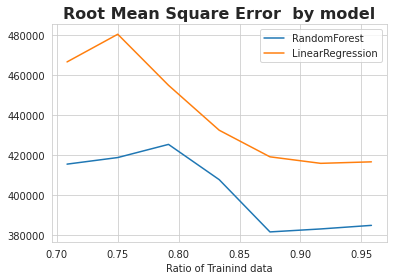

In [209]:
# Visualization

sns.lineplot(data=Results,x='Ratio of Trainind data' , y='RandomForest',label='RandomForest')
sns.lineplot(data=Results,x='Ratio of Trainind data' , y='LinearRegression(OLS)',label='LinearRegression')
plt.xlabel('Ratio of Trainind data')
plt.ylabel('')
plt.title("Root Mean Square Error  by model", weight = 'bold', fontsize = 16)

* **The smaller the Root Mean Square Error is, the better the performance.**

* **In general, RMSE of RandomForest model is definitely smaller than LinearRegression(OLS).**

* **RandomForest model is better (Reserach Question)**

* **It seems that when ratio of training data is larger, RMSE is smaller. However, if ratio is too large, RMSE is getting a bit smaller (Topic)**
